## Merge kidney datasets

In [3]:
import scanpy as sc
import numpy as np
import pandas as pd
import os, sys, string

#from sc_utils import get_marker_gene_summary_table, cell_count_dotplot

#from scanpy.plotting._tools import plot_scatter
sc.set_figure_params(vector_friendly=False, fontsize=18)
import leidenalg
import pandas as pd
import numpy as np
import anndata

from scipy.io import mmwrite
import matplotlib.pyplot as plt

from typing import Tuple, Union, List, Dict, Callable
import os
import gzip
import shutil
import inspect
import h5py
import anndata
from collections import Counter
from harmony import harmonize
import scanpy.external as sce

import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
home      = "/Users/shayat/Documents/Aachen/projects/cul3_turgay/"
datahome  = home+ "data/"
resulthome= home+ "results/"

In [5]:
#1
h4cfile  = "human_CD10negative_r1_subcluster.h5ad"
#2
hcmdcm_file="human_CD10positive_r1_subcluster.h5ad"

In [27]:
def plot_umap(adata, color_type, mytitle):
    # plot umap
    fig = plt.figure(figsize=(5, 5))
    plt.plot(adata.obsm['X_scvi_umap'][:, 0], 
         adata.obsm['X_scvi_umap'][:, 1], '.', ms=1, alpha=0.1, color=color_type)
    plt.xlabel('UMAP 0')
    plt.ylabel('UMAP 1')
    plt.title(mytitle)
    plt.gca().grid(False)
    plt.xticks([])
    plt.yticks([])

    # plt.tight_layout()
    # fig.savefig(fig_prefix + '_umap.pdf', bbox_inches='tight')
    
    return

def plot_this_df(adata, mykey, mytitle, myplot_handler):
    plt.figure(figsize=(5, 5))
    sc.pl.embedding(adata, basis=myplot_handler, color=mykey, ax=plt.gca(), alpha=0.5, show=False)

    df = pd.DataFrame(adata.obsm['X_scvi_umap'])
    df['cluster'] = adata.obs[mykey].values
    mean_pos = df.groupby('cluster').median()

    for c in mean_pos.index:    
        plt.gca().text(mean_pos.loc[c][0], mean_pos.loc[c][1], c.split(':')[0], 
                       fontsize=16, color='black')

    # plt.tight_layout()
    # fig.savefig(fig_prefix + '_umap_' + key + '.pdf', bbox_inches='tight')

    plt.title(mytitle+ ' ' + mykey)
    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')

    plt.show()
    
    return

In [10]:
## START

In [8]:
adata    = sc.read_h5ad(resulthome+h4cfile)

In [9]:
bdata = sc.read_h5ad(resulthome+hcmdcm_file)

In [11]:
adata

AnnData object with n_obs × n_vars = 1826 × 23446
    obs: 'Annotation.Level.1', 'Annotation.Level.2', 'Annotation.Level.3', 'Core.Matrisome.Expression.Score', 'Patient ID', 'Sample', 'condition', 'sex', 'Sex', 'Age [years]', 'Serum creatinine [mg/dL]', 'eGFR (mL/min/1.73m2)', 'Interstitial fibrosis [%]', 'Tubular atrophy [%]', 'ischemia time in minutes', 'diabetes', 'Hyper-tension', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden0.3'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'Annotation.Level.1_colors', 'Annotation.Level.2_colors', 'Sample_colors', 'Serum creatinine [mg', 'Tubular atrophy [%]_colors', 'condition_colors', 'rank_genes_groups0.3'
    obsm: 'UMAP', 'X_pca_harmony', 'X_umap'

In [12]:
Counter(adata.obs['Sample'])

Counter({'CDm12': 520,
         'CDm9': 228,
         'CDm8': 189,
         'CDm10': 168,
         'CDm1': 118,
         'CDm3': 106,
         'CDp1': 104,
         'CDm7': 103,
         'CDp3': 89,
         'CDm5': 63,
         'CDm13': 60,
         'CDm2': 39,
         'CDm11': 35,
         'CDp2': 4})

In [13]:
Counter(adata.obs['leiden0.3'])

Counter({'0': 835,
         '1': 621,
         '2': 123,
         '3': 86,
         '4': 61,
         '5': 42,
         '6': 33,
         '7': 25})

In [14]:
#  Custer naming
res = 0.3

cluster_names = {
"0":"0 Healthy PT S1/2",
"1":"1 Injured PT/thin limb",
"2":"2 Thin limb",
"3":"3 Injured PT and EC",
"4":"4 Injured PT and Fib",
"5":"5 Healthy PT S1/2/3",
"6":"6 Thin limb",
"7":"7 Injured PT S1/2/3"
}

adata.obs['leiden' + str(res)] = adata.obs['leiden' + str(res)].apply(lambda s: cluster_names[s])

In [15]:
adata.obs.rename(columns={'leiden0.3':'mycelltypes'},inplace=True)
adata.obs.rename(columns={'condition':'myconditions'},inplace=True)
adata.obs.rename(columns={'Sample':'mypatients'},inplace=True)

In [16]:
bdata

AnnData object with n_obs × n_vars = 31875 × 16193
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Annotation.Level.1', 'Annotation.Level.2', 'Annotation.Level.3', 'Patient.ID', 'sizeFactor', 'ident', 'Sex', 'Age [years]', 'Serum creatinine [mg/dL]', 'eGFR (mL/min/1.73m2)', 'Interstitial fibrosis [%]', 'Tubular atrophy [%]', 'ischemia time in minutes', 'diabetes', 'Hyper-tension', 'diagnosis', 'leiden1.1', 'leiden0.7'
    uns: 'Annotation.Level.3_colors', 'Interstitial fibrosis [%]_colors', 'Sex_colors', 'X_name', 'rank_genes_groups0.7', 'rank_genes_groups1.1'
    obsm: 'UMAP', 'X_pca_harmony', 'X_umap'
    layers: 'logcounts'

In [17]:
Counter(bdata.obs['diagnosis'])

Counter({'Normal kidney': 28035, 'benigne nephrosclerosis': 3840})

In [18]:
#  Custer naming
res = 0.7

cluster_names = {
"0":"0 PT",
"1":"1 PT",
"2":"2 PT",
"3":"3 (likely-Injured_PT",
"4":"4 Injured PT/thin limb",
"5":"5 PT/Thin limb",
"6":"6 PT"
}

bdata.obs['leiden' + str(res)] = bdata.obs['leiden' + str(res)].apply(lambda s: cluster_names[s])

In [19]:
bdata.obs.rename(columns={'leiden0.7':'mycelltypes'},inplace=True)
bdata.obs.rename(columns={'diagnosis':'myconditions'},inplace=True)
bdata.obs.rename(columns={'Patient.ID':'mypatients'},inplace=True)

In [20]:
## Put everything together

hdata = anndata.AnnData.concatenate(*[adata, bdata])
hdata

/var/folders/mj/150fcld105b9nxwtjxcvhy8c0000gn/T/ipykernel_22852/3756151441.py:3: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  hdata = anndata.AnnData.concatenate(*[adata, bdata])


AnnData object with n_obs × n_vars = 33701 × 15429
    obs: 'Annotation.Level.1', 'Annotation.Level.2', 'Annotation.Level.3', 'Core.Matrisome.Expression.Score', 'Patient ID', 'mypatients', 'myconditions', 'sex', 'Sex', 'Age [years]', 'Serum creatinine [mg/dL]', 'eGFR (mL/min/1.73m2)', 'Interstitial fibrosis [%]', 'Tubular atrophy [%]', 'ischemia time in minutes', 'diabetes', 'Hyper-tension', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'mycelltypes', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sizeFactor', 'ident', 'leiden1.1', 'batch'
    var: 'gene_ids-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0'
    obsm: 'UMAP', 'X_pca_harmony', 'X_umap'

In [21]:
hdata

AnnData object with n_obs × n_vars = 33701 × 15429
    obs: 'Annotation.Level.1', 'Annotation.Level.2', 'Annotation.Level.3', 'Core.Matrisome.Expression.Score', 'Patient ID', 'mypatients', 'myconditions', 'sex', 'Sex', 'Age [years]', 'Serum creatinine [mg/dL]', 'eGFR (mL/min/1.73m2)', 'Interstitial fibrosis [%]', 'Tubular atrophy [%]', 'ischemia time in minutes', 'diabetes', 'Hyper-tension', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'mycelltypes', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sizeFactor', 'ident', 'leiden1.1', 'batch'
    var: 'gene_ids-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0'
    obsm: 'UMAP', 'X_pca_harmony', 'X_umap'

In [22]:
## make a copy if further filtering is needed
tmp_bdata = hdata.copy()

In [23]:
# Delete the mitochondrial genes COMPLETELY
rps_genes_bool = hdata.var.index.str.startswith('RPS')
rpl_genes_bool = hdata.var.index.str.startswith('RPL')

print("\n Before mt_counter", Counter(rps_genes_bool), Counter(rpl_genes_bool))
mt_genes_bool = rps_genes_bool + rpl_genes_bool


 Before mt_counter Counter({np.False_: 15329, np.True_: 100}) Counter({np.False_: 15252, np.True_: 177})


In [24]:
hdata.var[mt_genes_bool]

,gene_ids-0,mt-0,n_cells_by_counts-0,mean_counts-0,pct_dropout_by_counts-0,total_counts-0
RPL23AP24,RPL23AP24,False,599,0.011553,98.844722,599.0
RPL22,RPL22,False,41508,2.791992,19.944454,144762.0
RPL11,RPL11,False,48835,7.423499,5.813034,384901.0
RPS6KA1,RPS6KA1,False,2181,0.048198,95.793554,2499.0
RPL5P4,RPL5P4,False,1238,0.026866,97.612297,1393.0
...,...,...,...,...,...,...
RPL36A,RPL36A,False,38824,2.195144,25.121025,113816.0
RPL36A-HNRNPH2,RPL36A-HNRNPH2,False,20846,0.479566,59.794789,24865.0
RPL39,RPL39,False,46500,6.259909,10.316496,324570.0
RPL10,RPL10,False,50418,13.819977,2.759938,716552.0


In [25]:
tmp_bdata = tmp_bdata[:, tmp_bdata.var_names[~mt_genes_bool]]
#adata._inplace_subset_var(~mt_genes_bool)
tmp_bdata = tmp_bdata[:, ~tmp_bdata.var_names.str.startswith('MALAT')].copy()

In [26]:
## Seurat V3 needs raw counts
sc.pp.highly_variable_genes(tmp_bdata, n_top_genes = 2000, flavor = 'seurat_v3')

ValueError: numpy.dtype size changed, may indicate binary incompatibility. Expected 96 from C header, got 88 from PyObject

In [24]:
sc.pp.normalize_total(tmp_bdata, target_sum=1e4)
sc.pp.log1p(tmp_bdata)

In [25]:
cdata = tmp_bdata[:, tmp_bdata.var.highly_variable]

In [26]:
sc.tl.pca(cdata, svd_solver='arpack', n_comps = 50)

In [27]:
Counter(tmp_bdata.obs['mypatients'])

Counter({'CDm1': 118,
         'CDm2': 39,
         'CDm3': 106,
         'CDm5': 63,
         'CDm7': 103,
         'CDm8': 189,
         'CDm9': 228,
         'CDm10': 168,
         'CDm11': 35,
         'CDm12': 520,
         'CDm13': 60,
         'CDp1': 2989,
         'CDp2': 694,
         'CDp3': 5930,
         'CDp4': 8044,
         'CDp5': 6631,
         'CDp6': 5258,
         'CDp7': 265,
         'CDp8': 2261})

In [28]:
sce.pp.harmony_integrate(cdata, 'mypatients', max_iter_harmony=40)

2023-04-21 16:05:58,534 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-04-21 16:06:05,430 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-04-21 16:06:05,613 - harmonypy - INFO - Iteration 1 of 40
2023-04-21 16:06:14,735 - harmonypy - INFO - Iteration 2 of 40
2023-04-21 16:06:26,145 - harmonypy - INFO - Converged after 2 iterations


In [29]:
Z = cdata.obsm['X_pca_harmony']

In [30]:
tmp_bdata.obsm['X_pca_harmony'] = Z

In [31]:
sc.pp.neighbors(tmp_bdata, n_neighbors=10, n_pcs=50, use_rep = 'X_pca_harmony',\
                metric = 'cosine', key_added = 'PC_harmony')

2023-04-21 16:06:29.205385: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [32]:
sc.tl.umap(tmp_bdata, neighbors_key = 'PC_harmony', min_dist = 0.5)

In [33]:
res_list = [0.1, 0.3, 0.5, 0.7, 0.9, 1.1, 1.3, 1.5, 1.7]
#res_list = [1.3, 1.5, 1.7]

for res in res_list:
    print(res)
    sc.tl.leiden(tmp_bdata, resolution = res, key_added = 'leiden'+str(res), neighbors_key = 'PC_harmony')

0.1
0.3
0.5
0.7
0.9
1.1
1.3
1.5
1.7


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<Axes: title={'center': 'leiden1.1'}, xlabel='UMAP1', ylabel='UMAP2'>

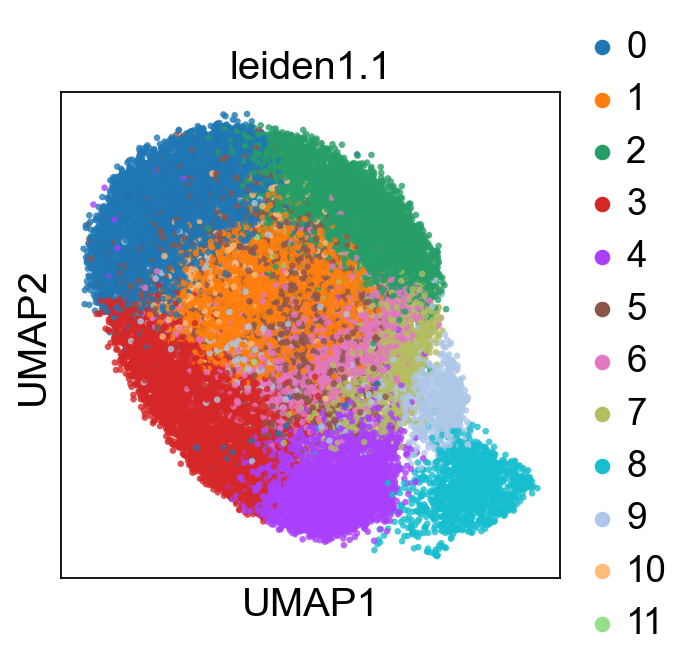

In [36]:
res = 1.1
sc.pl.embedding(tmp_bdata, basis='umap', color='leiden'+str(res), ax=plt.gca(), show=False, alpha=0.8, size=35)

/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<Axes: title={'center': 'myconditions'}, xlabel='UMAP1', ylabel='UMAP2'>

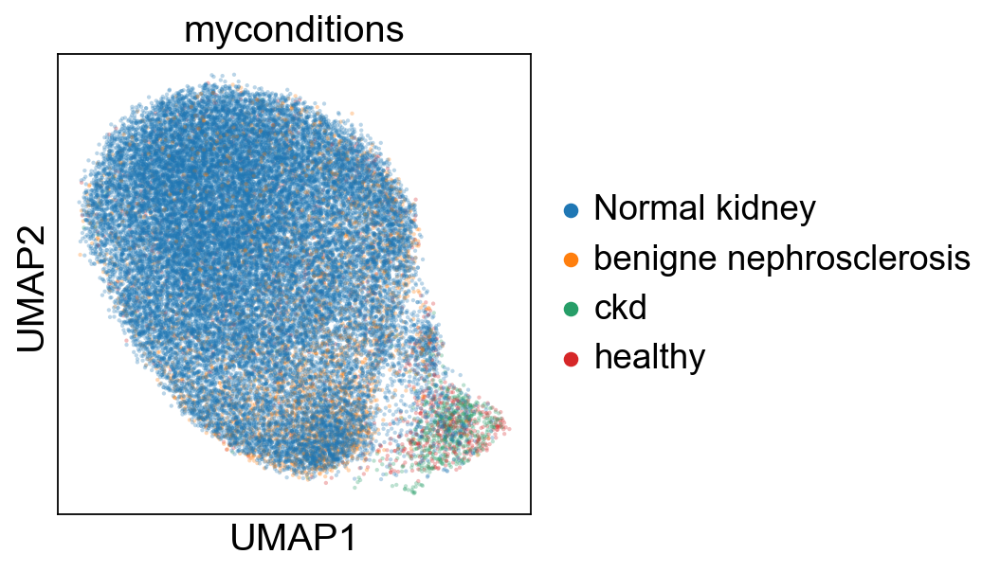

In [37]:
sc.pl.embedding(tmp_bdata, basis='umap', color='myconditions', ax=plt.gca(), show=False, alpha=0.3, size=15)

In [39]:
min_in_group_fraction=0.1
max_out_group_fraction=0.5
min_log_fold_change=1.


for res in res_list:
    print(res)
    print("Finding markers")
    sc.tl.rank_genes_groups(tmp_bdata,
                                    groupby='leiden'+str(res),
                                    key_added='rank_genes_groups' + str(res),
                                    method='wilcoxon',
                                    use_raw=False)

    print("Filtering markers")
    sc.tl.filter_rank_genes_groups(tmp_bdata,
                                   groupby='leiden'+str(res),
                                   key='rank_genes_groups' + str(res),
                                   key_added='filter_rank_genes_groups' + str(res),
                                   min_in_group_fraction=min_in_group_fraction,
                                   min_fold_change=min_log_fold_change,
                                   max_out_group_fraction=max_out_group_fraction,
                                   use_raw=False)

0.1
Finding markers
Filtering markers
0.3
Finding markers
Filtering markers
0.5
Finding markers
Filtering markers
0.7
Finding markers
Filtering markers
0.9
Finding markers
Filtering markers
1.1
Finding markers
Filtering markers
1.3
Finding markers
Filtering markers
1.5
Finding markers
Filtering markers
1.7
Finding markers


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.

Filtering markers


In [40]:
# copy back over to adata

for res in res_list:
    print(res)
    try:
        hdata.obsm['X_umap'] = tmp_bdata.obsm['X_umap']
    except:
        print('Failed in copying over X_umap data')
    try:
        hdata.obsm['X_pca_harmony'] = tmp_bdata.obsm['X_pca_harmony']
    except:
        print('Failed in copying over X_pca_harmony data')
    try:
        hdata.obs['leiden' + str(res)] = tmp_bdata.obs['leiden' + str(res)]
    except:
        print('Failed in copying over leiden clustering data')
    try:
        hdata.uns['rank_genes_groups' + str(res)] = tmp_bdata.uns['rank_genes_groups' + str(res)]
    except:
        print('Failed in copying over rank_genes_groups data')
    try:
        hdata.uns['filter_rank_genes_groups' + str(res)] = tmp_bdata.uns['filter_rank_genes_groups' + str(res)]
    except:
        print('Failed in copying over filter_rank_genes_groups data')

    if '__is_in_cluster__' in hdata.obs.keys():
        del hdata.obs['__is_in_cluster__']

0.1
0.3
0.5
0.7
0.9
1.1
1.3
1.5
1.7


In [58]:
hdata

AnnData object with n_obs × n_vars = 33701 × 15429
    obs: 'Annotation.Level.1', 'Annotation.Level.2', 'Annotation.Level.3', 'Core.Matrisome.Expression.Score', 'Patient ID', 'mypatients', 'myconditions', 'sex', 'Sex', 'Age [years]', 'Serum creatinine [mg/dL]', 'eGFR (mL/min/1.73m2)', 'Interstitial fibrosis [%]', 'Tubular atrophy [%]', 'ischemia time in minutes', 'diabetes', 'Hyper-tension', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'mycelltypes', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sizeFactor', 'ident', 'leiden1.1', 'batch', 'leiden0.1', 'leiden0.3', 'leiden0.5', 'leiden0.7', 'leiden0.9', 'leiden1.3', 'leiden1.5', 'leiden1.7'
    var: 'gene_ids-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0'
    uns: 'rank_genes_groups0.1', 'rank_genes_groups0.3', 'rank_genes_groups0.5', 'rank_genes_groups0.7', 'rank_genes_groups0.9', 'rank_genes_groups1.1', 'rank_genes_groups1.3', 'rank_genes_groups1.

In [63]:
# copy back over to adata

for res in res_list:
    print(res)
    
    myclusters  = 'leiden'+str(res)
    allclusters = hdata.obs[myclusters].unique().tolist()

    adatas = []
    for mycluster in allclusters:

        tmp = sc.get.rank_genes_groups_df(hdata, group=mycluster, key='rank_genes_groups' + str(res))
        tmp["ident"] = mycluster
        adatas.append(tmp)
        #print(mycluster, tmp.shape)

    #print(thisframe)
    mdata = pd.concat(adatas)
    #print(mdata)

    mdata = mdata[(mdata.pvals_adj < 0.05) & (mdata.logfoldchanges > 0)]
    
    markerfilename = mytitle + '_' + str(res)+ '_logFC_stacked_marker_table.xlsx'
    print(markerfilename)
    #sys.exit()
    
    mdata.to_excel(datahome + markerfilename)

0.1
pt_ipt_populations_0.1_logFC_stacked_marker_table.xlsx
0.3
pt_ipt_populations_0.3_logFC_stacked_marker_table.xlsx
0.5
pt_ipt_populations_0.5_logFC_stacked_marker_table.xlsx
0.7
pt_ipt_populations_0.7_logFC_stacked_marker_table.xlsx
0.9
pt_ipt_populations_0.9_logFC_stacked_marker_table.xlsx
1.1
pt_ipt_populations_1.1_logFC_stacked_marker_table.xlsx
1.3
pt_ipt_populations_1.3_logFC_stacked_marker_table.xlsx
1.5
pt_ipt_populations_1.5_logFC_stacked_marker_table.xlsx
1.7
pt_ipt_populations_1.7_logFC_stacked_marker_table.xlsx


0.1


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


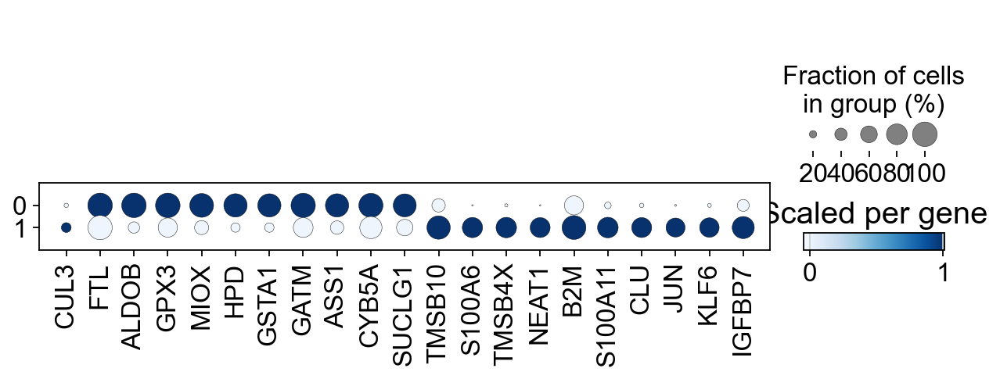

0.3


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


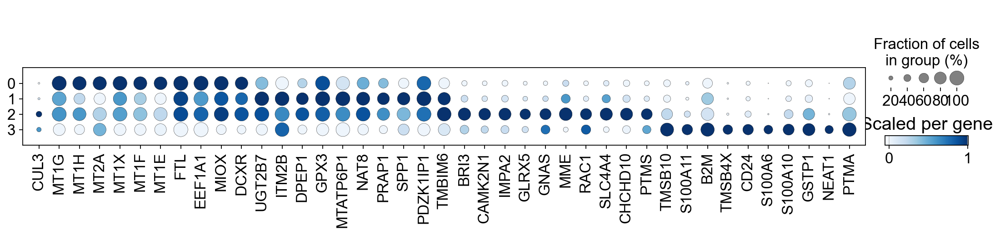

0.5


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


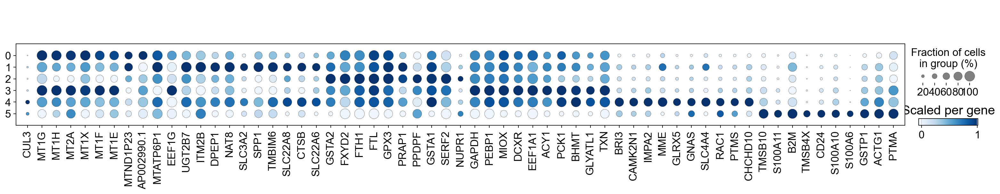

0.7


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


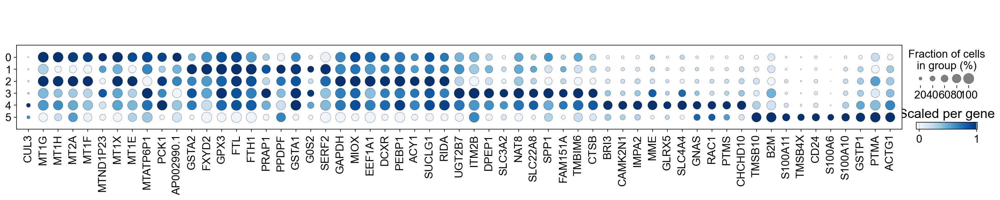

0.9


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


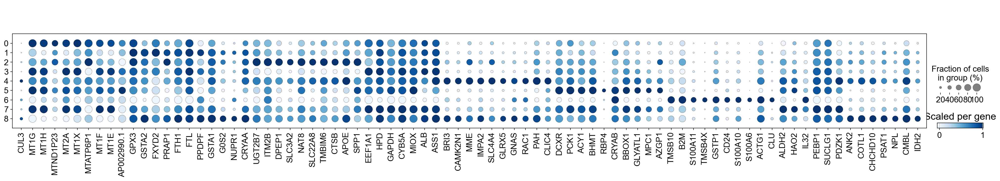

1.1


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


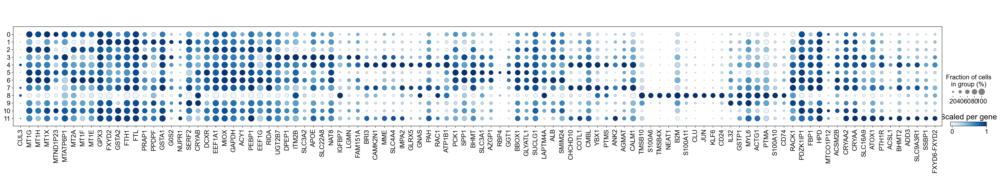

1.3


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


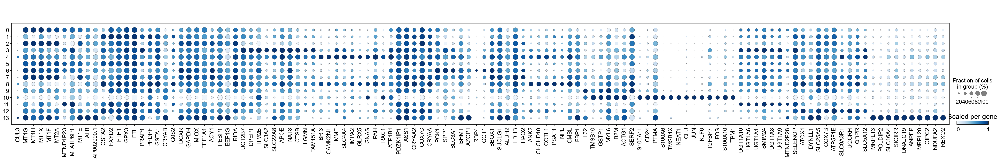

1.5


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


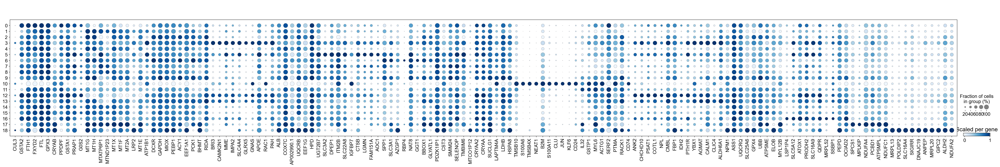

1.7


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


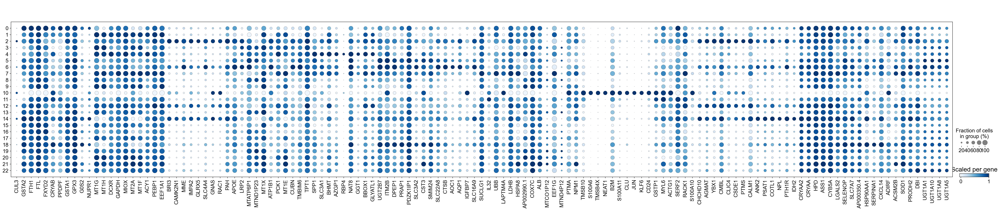

In [41]:
for res in res_list:
    print(res)
    cluster_id = 'leiden'+ str(res)

    plt.rcParams.update({'font.size': 18})
    n = 10

    marker_key = 'rank_genes_groups' + str(res)
    #marker_key = 'filter_rank_genes_groups' + str(res)

    marker_genes = np.array(tmp_bdata.uns[marker_key]['names'][:(n + 5)].tolist(), 
                            dtype=str).transpose()

    unique_markers = []
    unique_markers.extend(['CUL3'])

    for k in range(marker_genes.shape[0]):
        i = 0
        for g in marker_genes[k, :]:
            if i < n and g not in unique_markers and g != 'nan' and g != 'Malat1':  # exclude malat1 or others based on data
                unique_markers.append(g)
                i += 1

    #unique_markers.append("Postn")

    sc.pl.dotplot(tmp_bdata, var_names=unique_markers, groupby='leiden'+str(res), \
                                     use_raw=False, vmin=-0.05,
                  vmax=1.01,cmap='Blues', standard_scale='var', show=False)

    plt.title('Scaled per gene')
    plt.show()

In [45]:
# add treatment status
iz_samples      = set(['ckd',  'benigne nephrosclerosis'])
control_samples = set(['healthy', 'Normal kidney'])

def get_treatment(s):
    if s in iz_samples:
        return 'ckd'
    elif s in control_samples:
        return 'healthy'
    else:
        raise ValueError(f'sample {s} not in definitions')

tmp_bdata.obs['myconditions_combined'] = tmp_bdata.obs['myconditions'].apply(get_treatment).astype('category')

In [81]:
gene_list = ['CUL3']

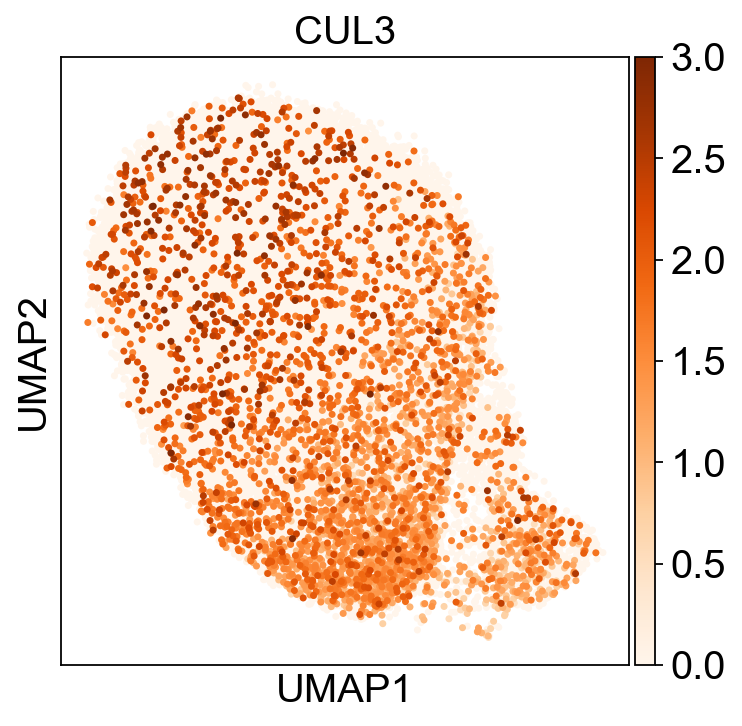

In [55]:
myrep = "umap"
plt.rcParams.update({'font.size': 18, 'figure.figsize': (5, 5)})
for gene in gene_list:
    sc.pl.embedding(tmp_bdata, basis=myrep, color=[gene], color_map='Oranges',\
                    size=40, vmax=3, save=gene+"_cd10pos.pdf")

In [84]:
# Check to make sure it's still counts
hdata[:,'GSN'].X.todense()

matrix([[1.],
        [2.],
        [1.],
        ...,
        [0.],
        [0.],
        [0.]], dtype=float32)

In [50]:
mytitle = 'pt_ipt_populations'
print(mytitle)

pt_ipt_populations


In [52]:
for res in res_list:
    print(res)
    cluster_id = 'leiden'+ str(res)
    del hdata.uns["filter_rank_genes_groups"+str(res)]

0.1
0.3
0.5
0.7
0.9
1.1
1.3
1.5
1.7


In [53]:
hdata.write(resulthome + mytitle+ ".h5ad")

In [73]:
cluster_id = 'leiden'+str(res)

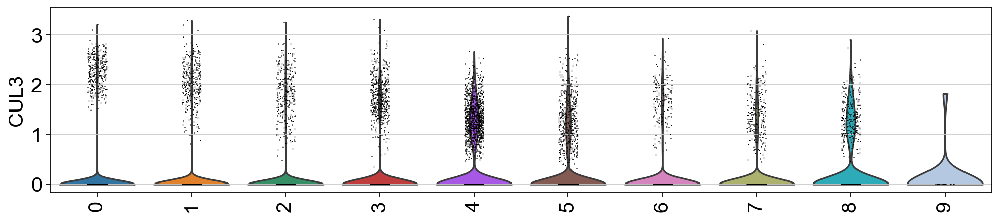

In [74]:
#Early enterocyte marker - Arg2
#sc.pl.umap(bdata, color='Arg2', use_raw=False)
plt.rcParams.update({'font.size': 18, 'figure.figsize': (12, 3)})
for gene in gene_list:
    #plt.figure(figsize=(12, 15))
    sc.pl.violin(tmp_bdata, groupby=cluster_id, keys=[gene], use_raw=False, rotation=90, ncols=1,\
                save=gene+"_cd10neg.pdf")

In [75]:
sc.tl.score_genes(tmp_bdata, gene_list=['CUL3'], score_name="cul3_signature")

/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


<Axes: title={'center': 'cul3_signature'}, xlabel='UMAP1', ylabel='UMAP2'>

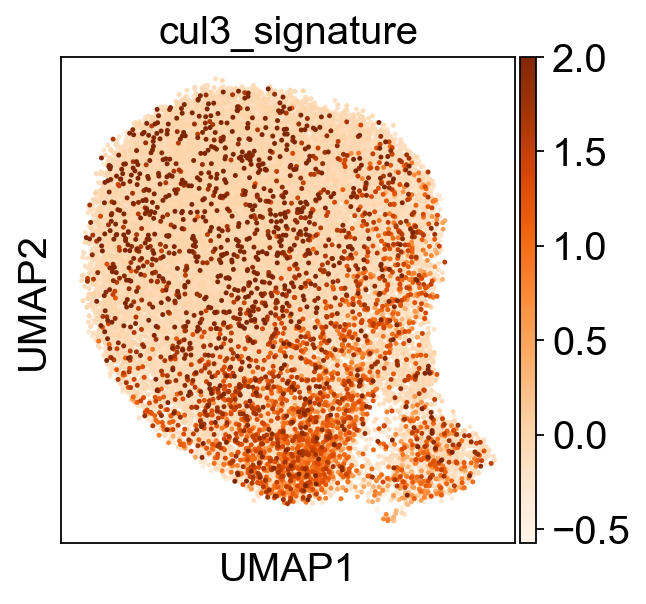

In [106]:
sc.pl.embedding(tmp_bdata, basis=myrep, color="cul3_signature", 
                color_map='Oranges',size=20, show=False, vmax=2)

         Falling back to preprocessing with `sc.pp.pca` and default params.


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


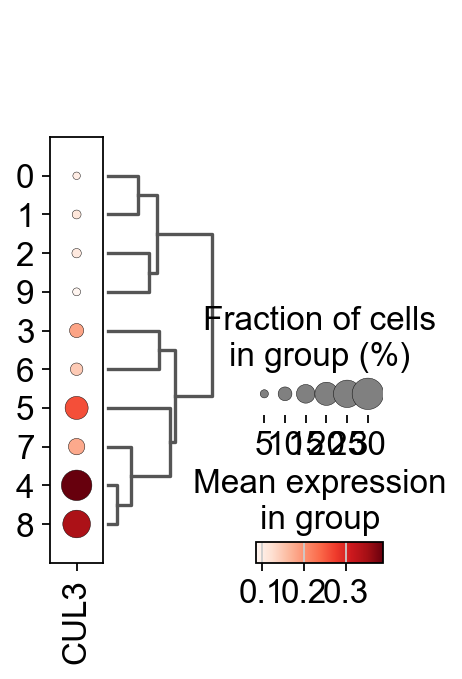

In [77]:
dp = sc.pl.dotplot(tmp_bdata, gene_list, groupby=cluster_id, dendrogram=True, save=\
                  "cd10_dotpot_overall_annotation1.pdf", show=True)
#plt.savefig(resulthome+"cd10_dotpot_overall_annotation1.pdf")

#dp.savefig("cd10_dotpot_overall_annotation1.pdf", bbox_inches='tight')

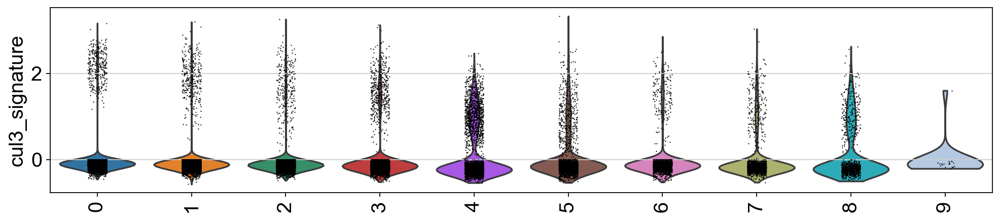

In [81]:
#Early enterocyte marker - Arg2
#sc.pl.umap(bdata, color='Arg2', use_raw=False)
plt.rcParams.update({'font.size': 18, 'figure.figsize': (12, 3)})

sc.pl.violin(tmp_bdata, groupby=cluster_id, keys=\
             ["cul3_signature"], use_raw=False, rotation=90, ncols=3)

0.1


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


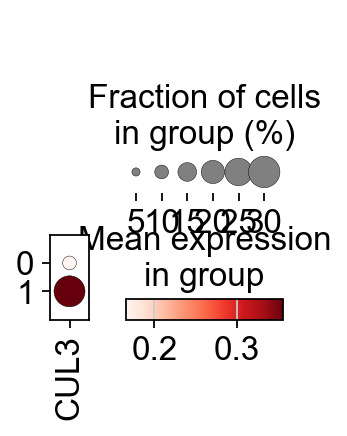

0.3
         Falling back to preprocessing with `sc.pp.pca` and default params.


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


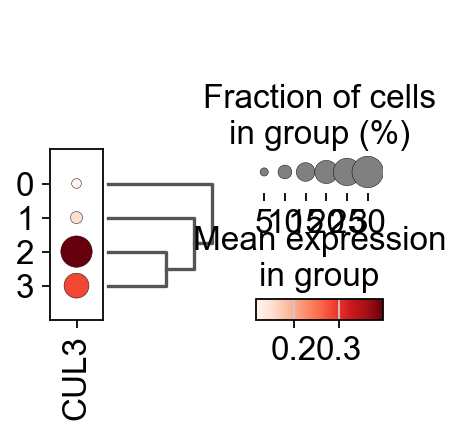

0.5


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


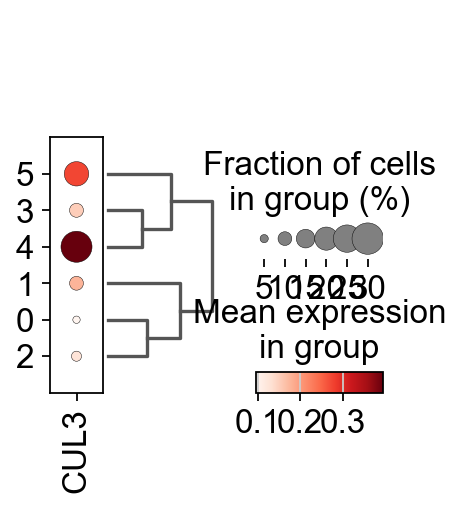

0.7


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


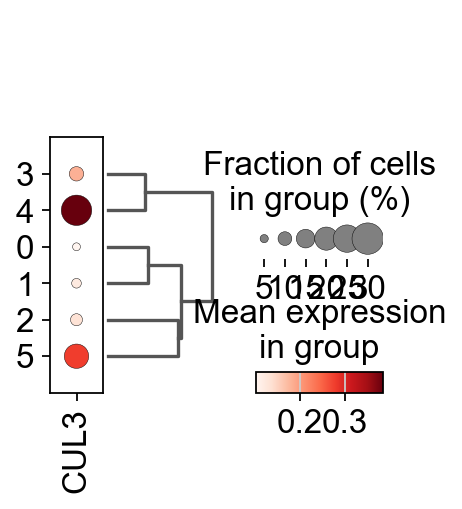

0.9


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


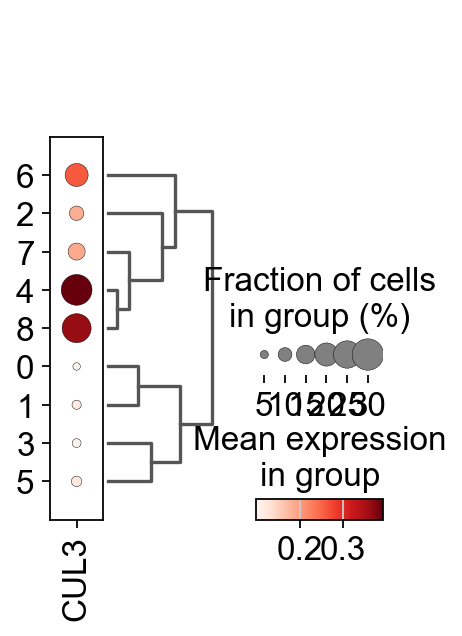

1.1


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


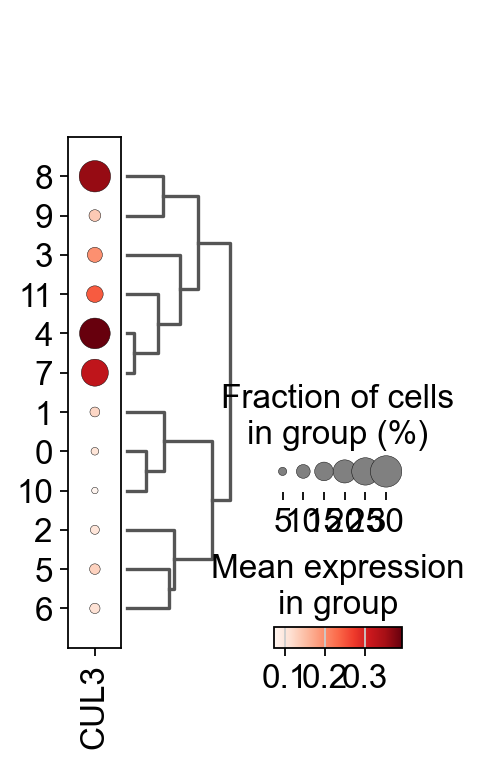

1.3


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


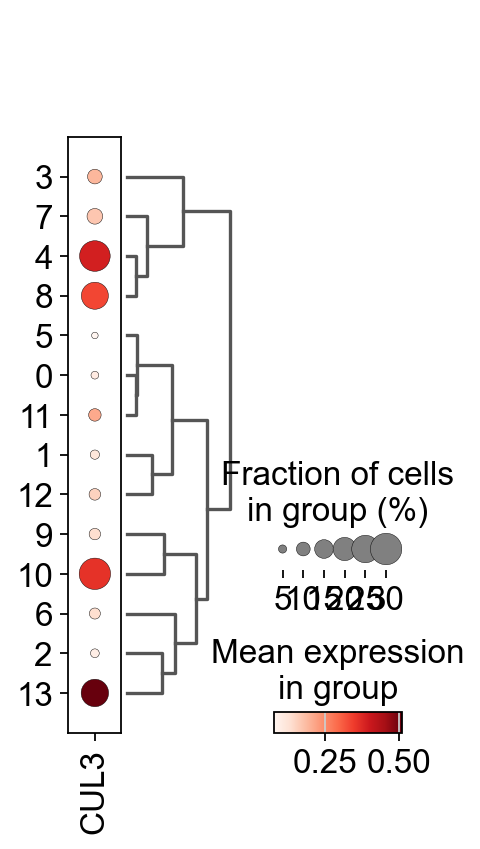

1.5


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


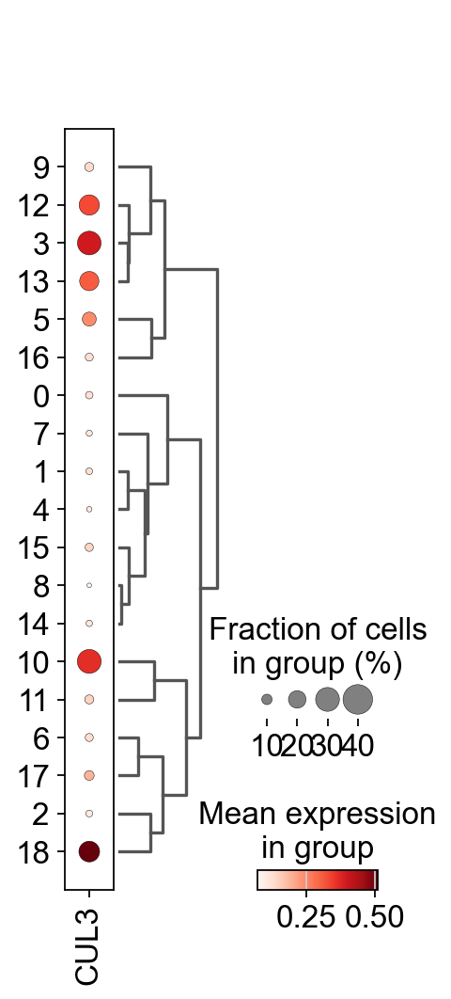

1.7


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


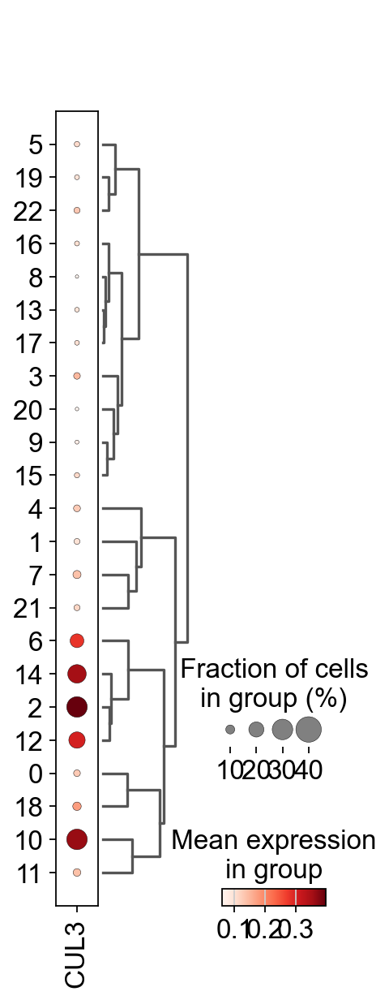

In [48]:
#cluster_id = "mycelltypes"
gene_list = ['CUL3']

for res in res_list:
    print(res)
    cluster_id = 'leiden'+ str(res)
    sc.pl.dotplot(tmp_bdata, gene_list, groupby=cluster_id, dendrogram=True, swap_axes=False)

In [83]:
# add treatment status
iz_samples      = set(['7 Injured PT S1/2/3', '3 Injured PT and EC', '4 Injured PT and Fib','1 Injured PT/thin limb' ])
control_samples = set(['0 Healthy PT S1/2', '2 Thin limb', '5 Healthy PT S1/2/3', '6 Thin limb'])

def get_treatment(s):
    if s in iz_samples:
        return 'Injured PT'
    elif s in control_samples:
        return 'healthy PT'
    else:
        raise ValueError(f'sample {s} not in definitions')

adata.obs['PT_status'] \
= adata.obs['mycelltypes'].apply(get_treatment).astype('category')

/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


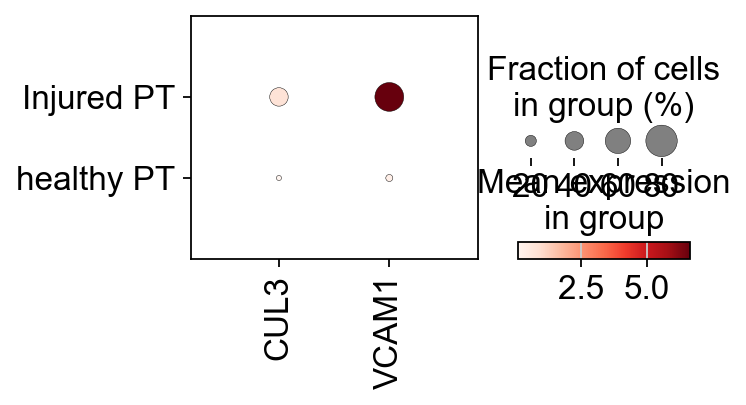

In [84]:
cluster_key = "PT_status"
gene_list = ['CUL3', 'VCAM1']
sc.pl.dotplot(adata, gene_list, groupby=cluster_key, dendrogram=True, swap_axes=False, figsize=(4, 2))

In [85]:
tmp_bdata

AnnData object with n_obs × n_vars = 33701 × 15151
    obs: 'Annotation.Level.1', 'Annotation.Level.2', 'Annotation.Level.3', 'Core.Matrisome.Expression.Score', 'Patient ID', 'mypatients', 'myconditions', 'sex', 'Sex', 'Age [years]', 'Serum creatinine [mg/dL]', 'eGFR (mL/min/1.73m2)', 'Interstitial fibrosis [%]', 'Tubular atrophy [%]', 'ischemia time in minutes', 'diabetes', 'Hyper-tension', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'mycelltypes', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sizeFactor', 'ident', 'leiden1.1', 'batch', 'leiden0.1', 'leiden0.3', 'leiden0.5', 'leiden0.7', 'leiden0.9', 'leiden1.3', 'cul3_signature'
    var: 'gene_ids-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg', 'log1p', 'PC_harmony', 'umap', 'leiden', 'leiden1.3_colors', 'myconditions_colors', 'rank_genes_groups1.3'

In [86]:
# add treatment status
iz_samples      = set(['ckd',  'benigne nephrosclerosis'])
control_samples = set(['healthy', 'Normal kidney'])

def get_treatment(s):
    if s in iz_samples:
        return 'ckd'
    elif s in control_samples:
        return 'healthy'
    else:
        raise ValueError(f'sample {s} not in definitions')

tmp_bdata.obs['myconditions_combined'] = tmp_bdata.obs['myconditions'].apply(get_treatment).astype('category')

In [87]:
Counter(tmp_bdata.obs['myconditions_combined'])

Counter({'healthy': 29238, 'ckd': 4463})

  leiden0.9 myconditions_combined variable  value
0         8               healthy     CUL3    0.0
1         8               healthy     CUL3    0.0
2         8               healthy     CUL3    0.0
3         8               healthy     CUL3    0.0
4         8               healthy     CUL3    0.0
/Users/shayat/Documents/Aachen/projects/cul3_turgay/results/8_human_deplot_up.csv


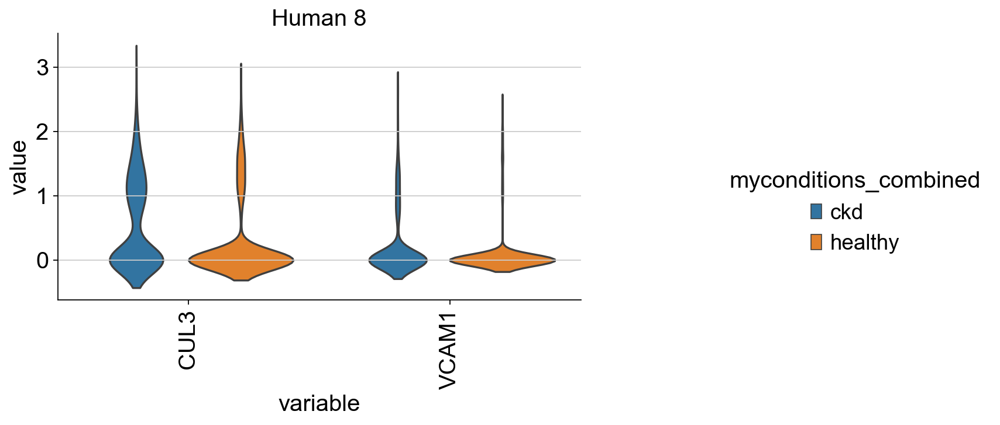

<Figure size 640x160 with 0 Axes>

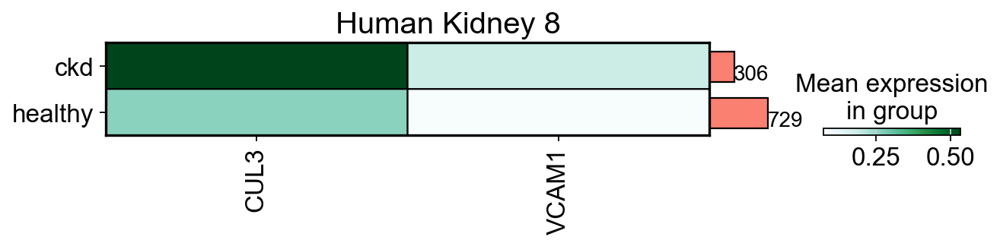

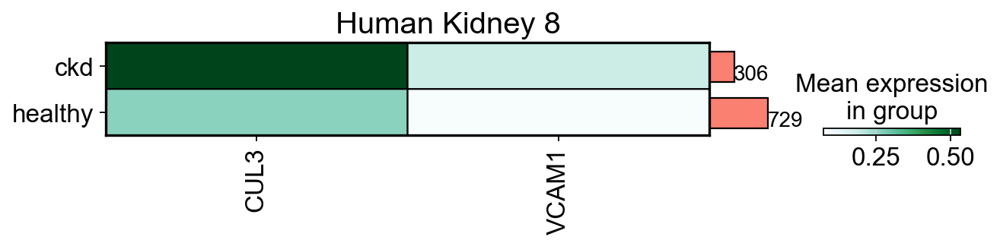

In [105]:
myclust = '8'

df  = sc.get.obs_df(tmp_bdata[tmp_bdata.obs[cluster_id]== myclust],\
                    gene_list + [cluster_id,'myconditions_combined'], use_raw=False)
df2 = df.melt(id_vars=[cluster_id,'myconditions_combined'], value_vars=gene_list)

print(df2.head())

g=sns.catplot(x = "variable", y = "value", hue = "myconditions_combined", kind = 'violin', 
               col = cluster_id, data = df2, col_wrap=1, inner=None, title=None, )
plt.xticks(rotation=90)
#g.fig.subplots_adjust(top=0.9) # adjust the Figure in rp
#g.fig.suptitle("Human " + myclust_id)

axes = g.axes.flatten()
axes[0].set_title("Human " + myclust)

g.fig.set_size_inches(12, 4)

mytitle = "Human Kidney " + myclust
#dp = sc.pl.dotplot(hdata[hdata.obs["cluster_name"] == myclust], gene_list \
#                       , figsize=(10, 3), title=mytitle  \
#                       , groupby=["treatment"], dendrogram=False, return_fig=True)

#dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.95,cmap="BuGn").show()#, cmap="Set2").show()

plt.figure(figsize=(8, 2))
dp = sc.pl.matrixplot(tmp_bdata[tmp_bdata.obs[cluster_id] == myclust], gene_list \
                       , figsize=(9, 1), title=mytitle  \
                       , groupby=["myconditions_combined"], dendrogram=False, return_fig=True)

print(resulthome+ myclust+"_human_deplot_up.csv")
dp.values_df.to_csv(resulthome+ myclust+"_human_deplot_up.csv")

dp.add_totals().style(edge_color='black', edge_lw=0.95, cmap="BuGn").show()#, cmap="Set2").show()
dp.savefig(resulthome+ myclust+"_human_deplot_up.pdf", dpi=400, bbox_inches='tight')

In [89]:
cluster_id = 'leiden' + str(res)

In [90]:
import seaborn as sns

In [95]:
tmp_bdata.obs[cluster_id]

29815-0        5
29816-0        5
29817-0        5
29818-0        3
29820-0        3
              ..
cell31871-1    0
cell31872-1    2
cell31873-1    2
cell31874-1    2
cell31875-1    0
Name: leiden0.9, Length: 33701, dtype: category
Categories (10, object): ['0', '1', '2', '3', ..., '6', '7', '8', '9']

Proximal Tubule


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


<Figure size 640x640 with 0 Axes>

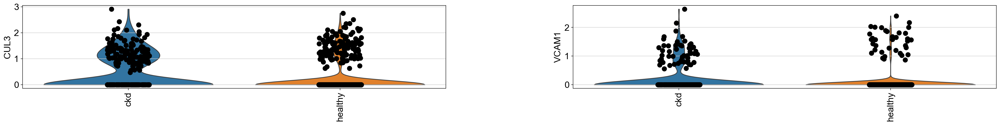

In [101]:
plt.figure(figsize=(8, 8))
print("Proximal Tubule")
sc.pl.violin(tmp_bdata[tmp_bdata.obs[cluster_id].isin(['8'])],\
             groupby='myconditions_combined', keys=gene_list, use_raw=False, rotation=90, size=10)

5


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


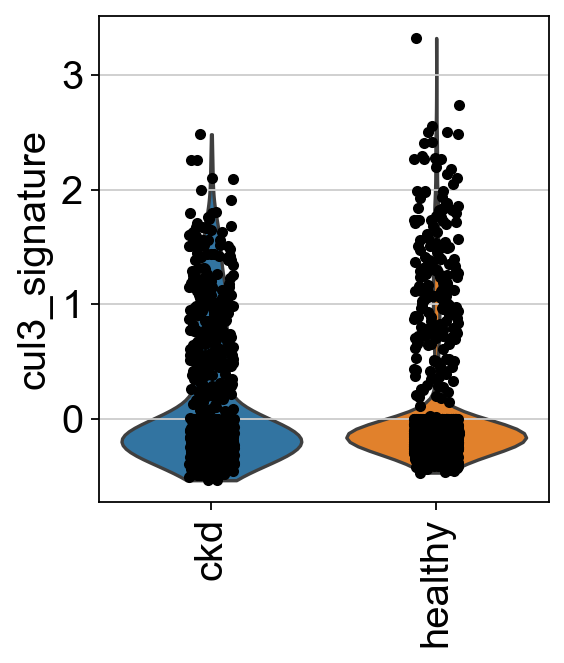

3


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


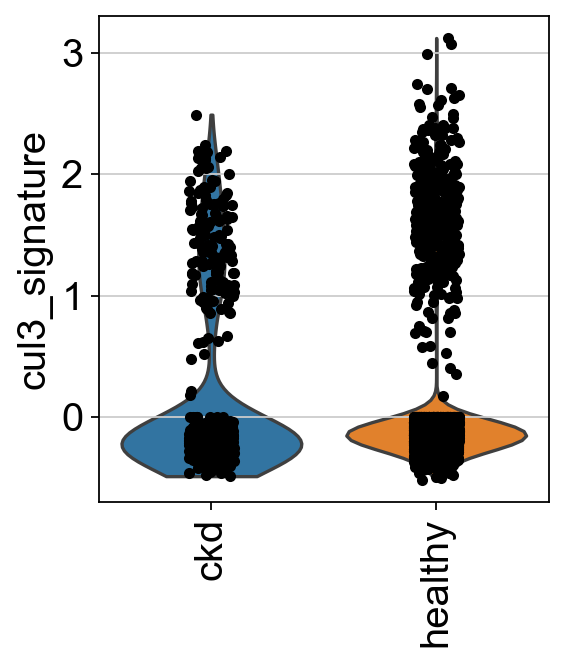

4


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


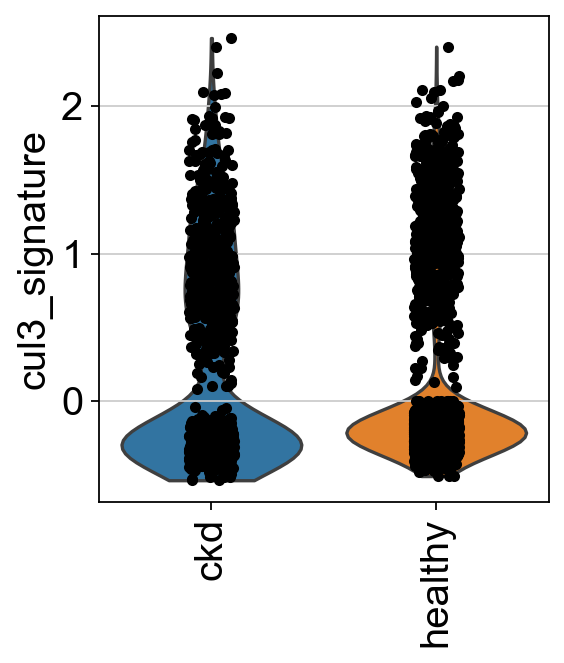

6


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


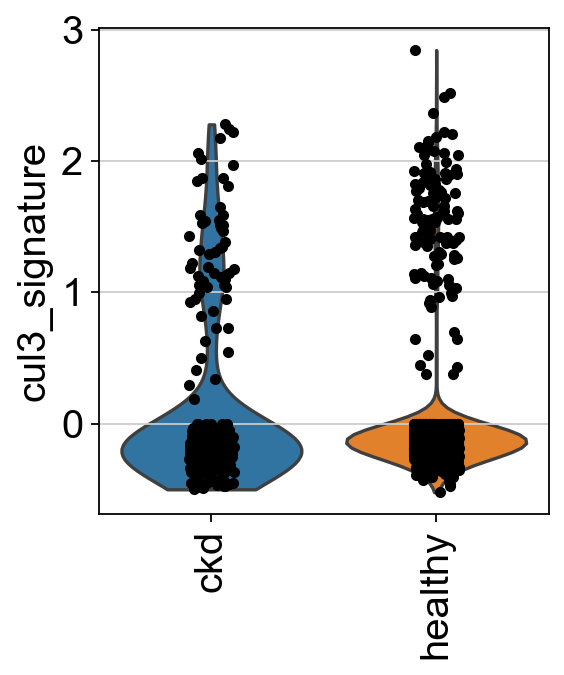

8


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


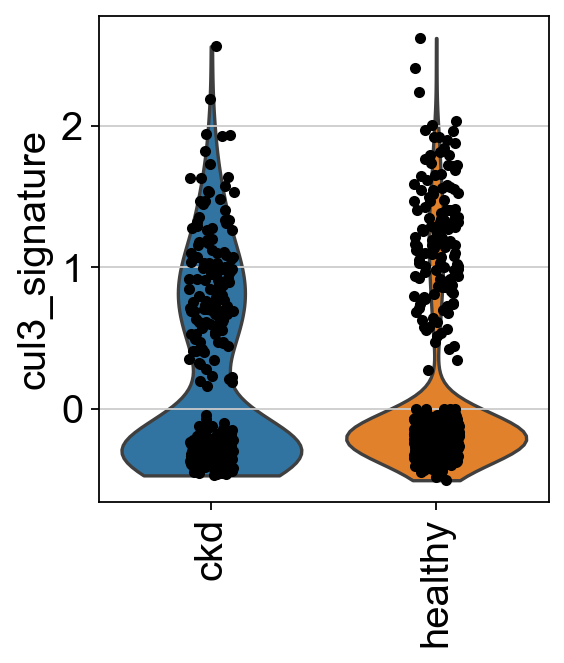

7


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


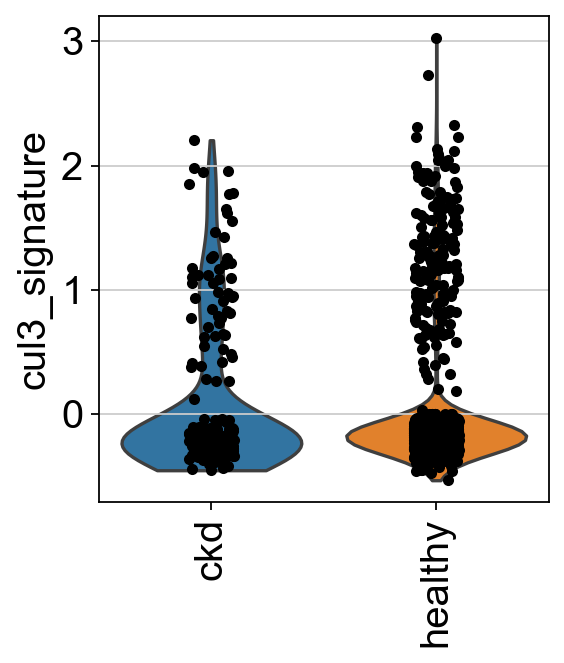

0


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


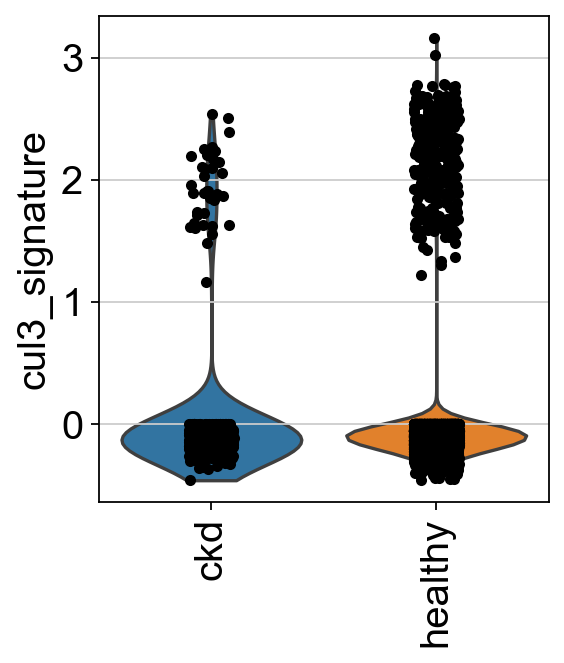

1


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


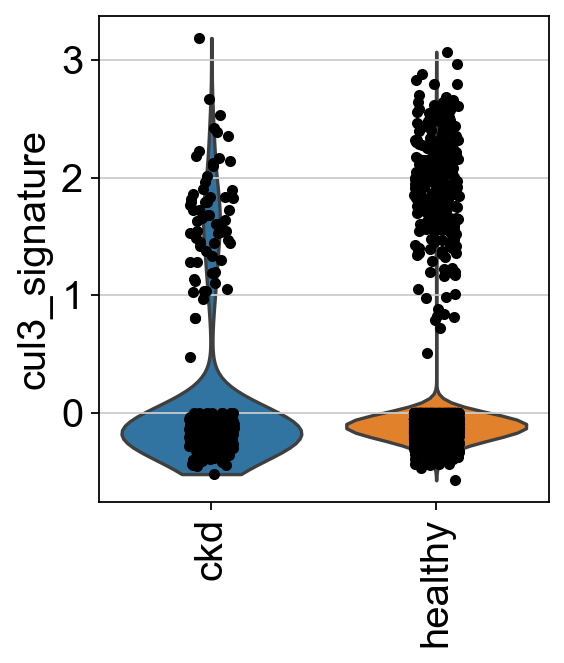

2


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


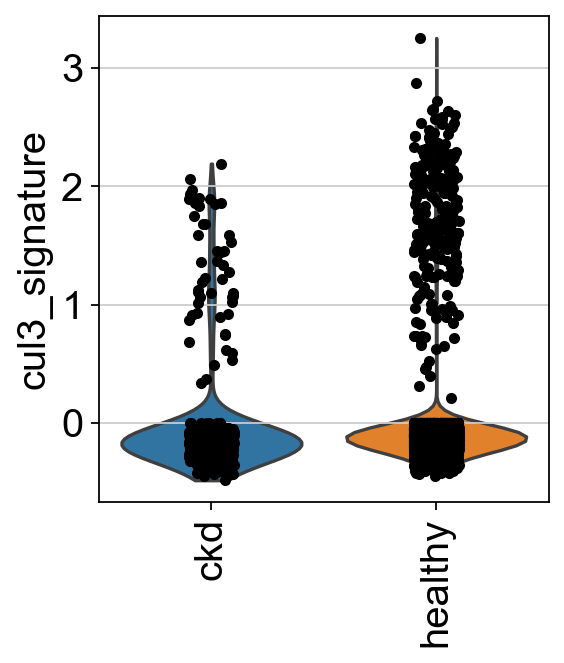

9


/Users/shayat/opt/anaconda3/envs/newenv/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


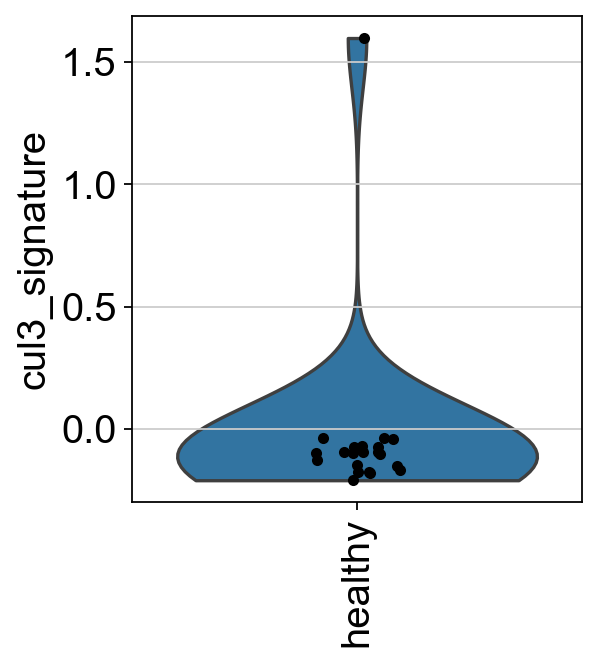

In [104]:
plt.rcParams.update({'font.size': 18, 'figure.figsize': (4, 4)})

myclusters = tmp_bdata.obs[cluster_id].drop_duplicates().values.tolist()

for myclust in myclusters:
    print(myclust)
    ax = sc.pl.violin(tmp_bdata[tmp_bdata.obs[cluster_id].isin([myclust])], groupby='myconditions_combined', \
                 keys=["cul3_signature"], use_raw=False, size=5, rotation=90, ncols=1, save=myclust+"_signature_condition.pdf")